In [1]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib
matplotlib.rc('font', **{'family': 'serif', 'serif': ['Computer Modern']})
matplotlib.rcParams['text.usetex'] = True
matplotlib.rcParams['text.latex.unicode'] = True
matplotlib.rcParams['figure.dpi'] = 150

import matplotlib.pyplot as plt
matplotlib.rcParams.update({'figure.autolayout': True})

import seaborn as sns
sns.set(style='whitegrid', font_scale=0.9, rc={"lines.linewidth": 1.4,
                                           'lines.markersize': 1.6}, font="serif")

# import jtplot module in notebook
from jupyterthemes import jtplot

# choose which theme to inherit plotting style from
# onedork | grade3 | oceans16 | chesterish | monokai | solarizedl | solarizedd
jtplot.style(theme='oceans16')

# set "context" (paper, notebook, talk, poster)
# scale font-size of ticklabels, legend, etc.
# remove spines from x and y axes and make grid dashed
jtplot.style(context='notebook', fscale=1, spines=False, gridlines='--')

# turn on X- and Y-axis tick marks (default=False)
# turn off the axis grid lines (default=True)
# and set the default figure size

from mpl_toolkits import mplot3d

/Users/dylancromer/.venvs/maszcal/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The text.latex.unicode rcparam was deprecated in Matplotlib 3.0 and will be removed in 3.2.
  


In [4]:
import numpy as np
import maszcal.lensing.shear as shear
from maszcal.interp_utils import cartesian_prod
import maszcal.interpolate
import maszcal.emulator
import supercubos
import pality
import smolyak
from sklearn.gaussian_process.kernels import Matern

In [5]:
zs = np.linspace(0, 1, 14)
mus = np.linspace(np.log(1e13), np.log(1e15), 30)
model = shear.BaryonCmShearModel(
    mu_bins=mus, 
    redshift_bins=zs,
    delta=500,
    mass_definition='crit',
)

In [6]:
rs = np.logspace(np.log10(0.03), np.log10(30), 60)

param_mins = np.array([0.1, 2, 0.1, -3]) #alpha, beta, gamma, a_sz
param_maxes = np.array([2, 5, 0.3, 3])

num = 138

lh = supercubos.LatinSampler().get_rand_sample(
    param_mins=param_mins,
    param_maxes=param_maxes,
    num_samples=num,
)

alphas = lh.T[0]
betas = lh.T[1]
gammas = lh.T[2]
a_szs = lh.T[3]

esds = model.stacked_delta_sigma(rs, alphas, betas, gammas, a_szs)

In [7]:
smolyak_grid = smolyak.grid.SmolyakGrid(d=4, mu=3, lb=param_mins, ub=param_maxes)
_alphas = smolyak_grid.grid.T[0]
_betas = smolyak_grid.grid.T[1]
_gammas = smolyak_grid.grid.T[2]
_a_szs = smolyak_grid.grid.T[3]
smolyak_esds = model.stacked_delta_sigma(rs, _alphas, _betas, _gammas, _a_szs)

In [8]:
colors = ['#72a555', '#ab62c0', '#c57c3c', '#638ccc', '#ca5670']

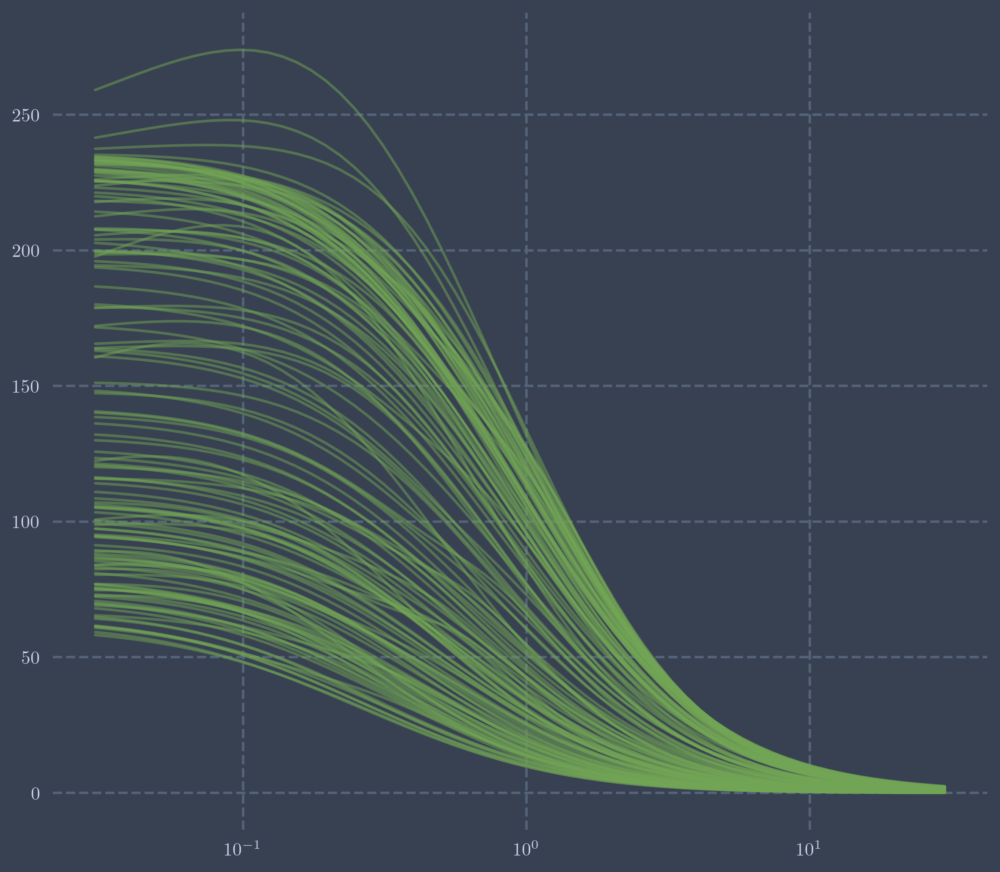

In [9]:
plt.plot(rs, esds, color=colors[0], alpha=0.5)
plt.xscale('log')
pass

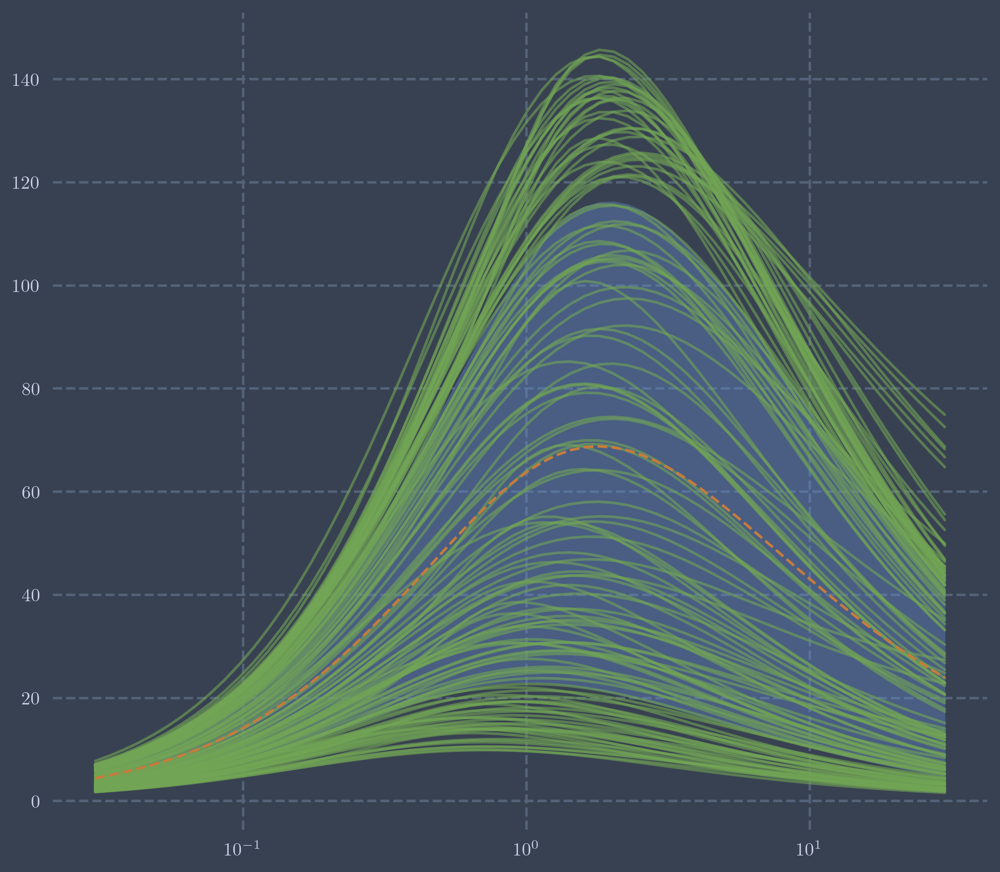

In [10]:
data = rs[:, None]*esds
plt.plot(rs, data, color=colors[0], alpha=0.6)
plt.plot(rs, data.mean(axis=-1), color=colors[2], alpha=1, linestyle='--')
plt.fill_between(rs,
                 data.mean(axis=-1) - data.std(axis=-1),
                 data.mean(axis=-1) + data.std(axis=-1), color=colors[3], alpha=0.4)
plt.xscale('log')
plt.savefig('../figs/emulator/test_data_rand100.pdf')
pass

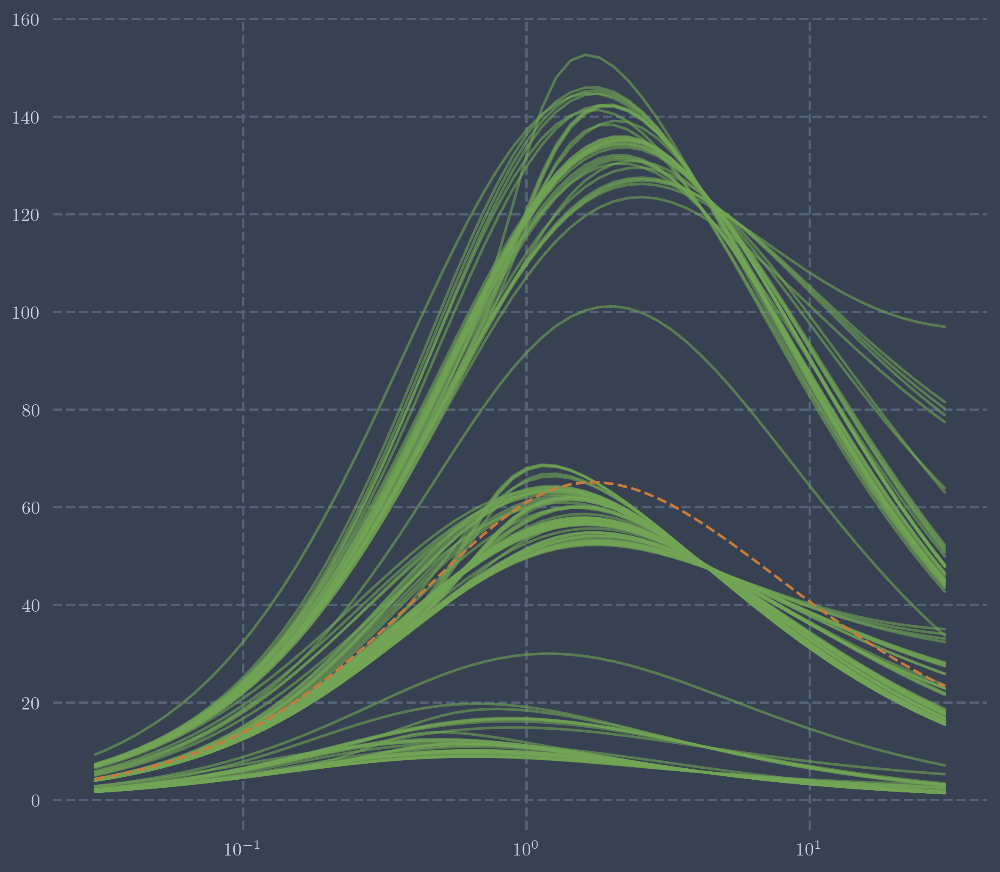

In [11]:
smolyak_data = rs[:, None]*smolyak_esds
plt.plot(rs, smolyak_data, color=colors[0], alpha=0.6)
plt.plot(rs, smolyak_data.mean(axis=-1), color=colors[2], alpha=1, linestyle='--')
plt.xscale('log')

In [12]:
pca = maszcal.emulator.LensingPca.create(data)
smolyak_pca = maszcal.emulator.LensingPca.create(smolyak_data)

In [13]:
phis = pca.basis_vectors
weights = pca.weights
explained_var = pca.explained_variance

In [14]:
smolyak_phis = smolyak_pca.basis_vectors
smolyak_weights = smolyak_pca.weights
smolyak_explained_var = smolyak_pca.explained_variance

In [15]:
for v in explained_var:
    if v > 1e-6:
        print(100*v)
    else:
        break

98.452003709874
1.184695519609785
0.28988616645768644
0.04981526479060561
0.018780755843522692
0.0037160280688591702
0.0006878728582769367
0.0002887849692919252


In [16]:
for v in smolyak_explained_var:
    if v > 1e-6:
        print(100*v)
    else:
        break

97.00069055545104
2.2091727633444274
0.612411482773082
0.12338991147671434
0.041537426075454714
0.009370633226525404
0.00241304768422002
0.0006759734359551015
0.00023927801695125753


In [17]:
assert np.allclose(
    (phis @ weights)*data.std(axis=-1)[:, None] + data.mean(axis=-1)[:, None],
    data,
)

assert np.allclose(
    (smolyak_phis @ smolyak_weights)
     *smolyak_data.std(axis=-1)[:, None] + smolyak_data.mean(axis=-1)[:, None],
    smolyak_data,
)

In [18]:
phis_ = phis[:, :8]
weights_ = weights[:8, :]
approx = (phis_@weights_) * data.std(axis=-1)[:, None] + data.mean(axis=-1)[:, None]
print(np.allclose(approx, data, rtol=1e-2))
err = (approx - data)/data
print(np.mean(err))
print(np.max(err))

False
-1.303064913796377e-06
0.013470452378114518


In [19]:
smolyak_phis_ = smolyak_phis[:, :8]
smolyak_weights_ = smolyak_weights[:8, :]
smolyak_approx = ((smolyak_phis_@smolyak_weights_)
                  * smolyak_data.std(axis=-1)[:, None] + smolyak_data.mean(axis=-1)[:, None])
print(np.allclose(smolyak_approx, smolyak_data, rtol=1e-2))
smolyak_err = (smolyak_approx - smolyak_data)/smolyak_data
print(np.mean(smolyak_err))
print(np.max(smolyak_err))

False
-6.377317246856542e-06
0.025996718995296424


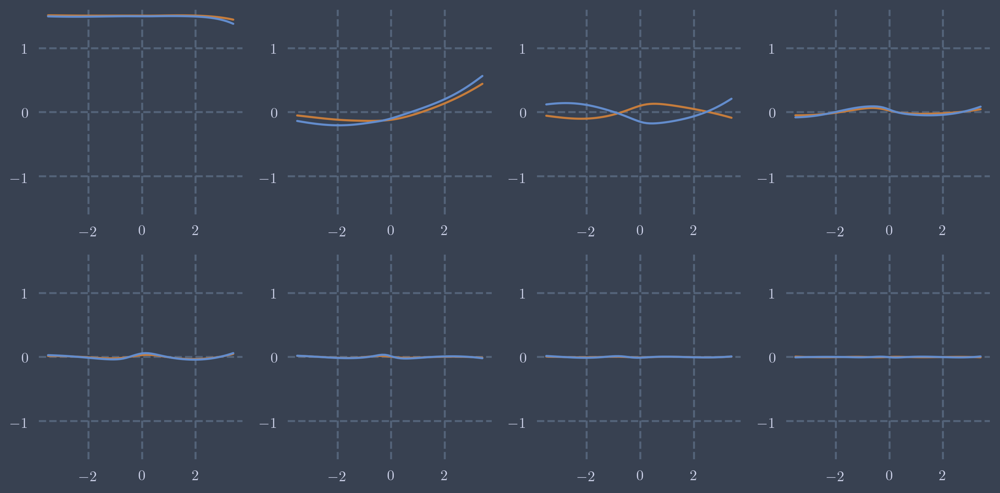

In [20]:
fig = plt.figure(figsize=(10, 5))

for i in range(8):
    plotnum = 241 + i
    ax = fig.add_subplot(plotnum)
    ax.plot(np.log(rs), phis.T[i], color=colors[2])
    ax.plot(np.log(rs), smolyak_phis.T[i], color=colors[3])
    ax.set_ylim(-1.6, 1.6)
    
plt.savefig('../figs/emulator/pcs_rand100.pdf')

In [21]:
lengths = (param_maxes - param_mins)[None, :]
latin_points = (lh - param_mins[None, :])/lengths

In [22]:
rbf_emulator = maszcal.emulator.PcaEmulator(
    mean=data.mean(axis=-1),
    std_dev=data.std(axis=-1),
    coords=lh,
    basis_vectors=phis_,
    weights=weights_,
    interpolator_class=maszcal.interpolate.RbfInterpolator,
)

gp_emulator = maszcal.emulator.PcaEmulator(
    mean=data.mean(axis=-1),
    std_dev=data.std(axis=-1),
    coords=lh,
    basis_vectors=phis_,
    weights=weights_,
    interpolator_class=maszcal.interpolate.GaussianProcessInterpolator,
)

gp_emulator_matern = maszcal.emulator.PcaEmulator(
    mean=data.mean(axis=-1),
    std_dev=data.std(axis=-1),
    coords=lh,
    basis_vectors=phis_,
    weights=weights_,
    interpolator_class=maszcal.interpolate.GaussianProcessInterpolator,
    interpolator_kwargs={'kernel': Matern()},
)

smolyak_emulator = maszcal.emulator.PcaEmulator(
    mean=smolyak_data.mean(axis=-1),
    std_dev=smolyak_data.std(axis=-1),
    coords=smolyak_grid,
    basis_vectors=smolyak_phis_,
    weights=smolyak_weights_,
    interpolator_class=maszcal.interpolate.SmolyakInterpolator,
)

In [23]:
print(((rbf_emulator(lh) - data)/data).max())
print(((gp_emulator(lh) - data)/data).max())
print(((gp_emulator_matern(lh) - data)/data).max())
print(((smolyak_emulator(smolyak_grid.grid) - smolyak_data)/smolyak_data).max())

0.013470452378058866
0.01347053471709252
0.01347042842422521
0.025996718995296424


In [24]:
assert np.allclose(rbf_emulator(lh), approx)
assert np.allclose(gp_emulator(lh), approx)
assert np.allclose(gp_emulator_matern(lh), approx)
assert np.allclose(smolyak_emulator(smolyak_grid.grid), smolyak_approx)

In [25]:
param_mins_check = np.array([0.1, 2, 0.1, -3]) #alpha, beta, gamma, a_sz
param_maxes_check = np.array([2, 5, 0.3, 3])

num_check = 100

rand = supercubos.LatinSampler().get_rand_sample(
    param_mins=param_mins_check,
    param_maxes=param_maxes_check,
    num_samples=num_check,
)

alphas_check = rand.T[0]
betas_check = rand.T[1]
gammas_check = rand.T[2]
a_szs_check = rand.T[3]

scaled_rand = (rand - param_mins[None, :])/lengths

esds_check = model.stacked_delta_sigma(rs, alphas_check, betas_check, gammas_check, a_szs_check)

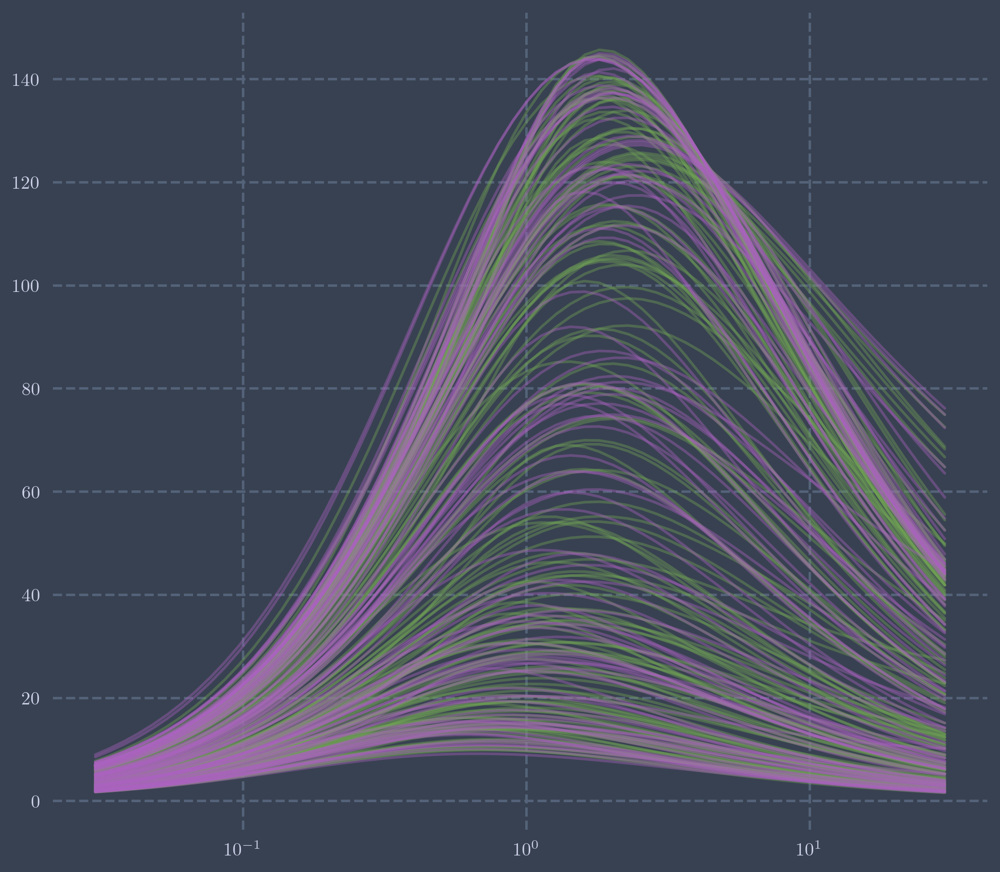

In [26]:
data_check = rs[:, None]*esds_check
plt.plot(rs, data, color=colors[0], alpha=0.4)
plt.plot(rs, data_check, color=colors[1], alpha=0.4)
plt.xscale('log')
plt.savefig('../figs/emulator/check_data_rand100.pdf')
pass

In [27]:
rbf_emulated = rbf_emulator(rand)
gp_emulated = gp_emulator(rand)
gp_emulated_mat = gp_emulator_matern(rand)
smolyak_emulated = smolyak_emulator(rand)

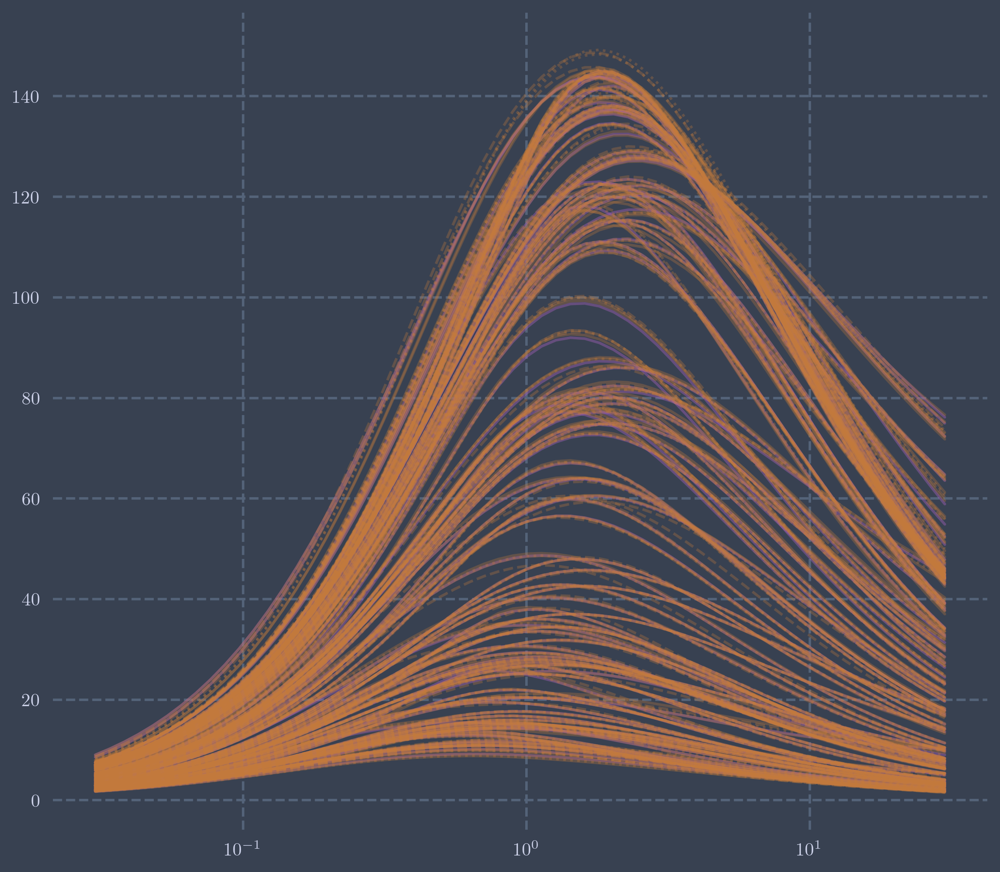

In [28]:
plt.plot(rs, data_check, color=colors[1], alpha=0.4)
plt.plot(rs, rbf_emulated, color=colors[2], alpha=0.3)
plt.plot(rs, gp_emulated, color=colors[2], alpha=0.3, linestyle='--')
plt.plot(rs, gp_emulated_mat, color=colors[2], alpha=0.3, linestyle=':')
plt.plot(rs, smolyak_emulated, color=colors[2], alpha=0.3, linestyle='-')
plt.xscale('log')

plt.savefig('../figs/emulator/interpolated_data_rand100.pdf')
pass

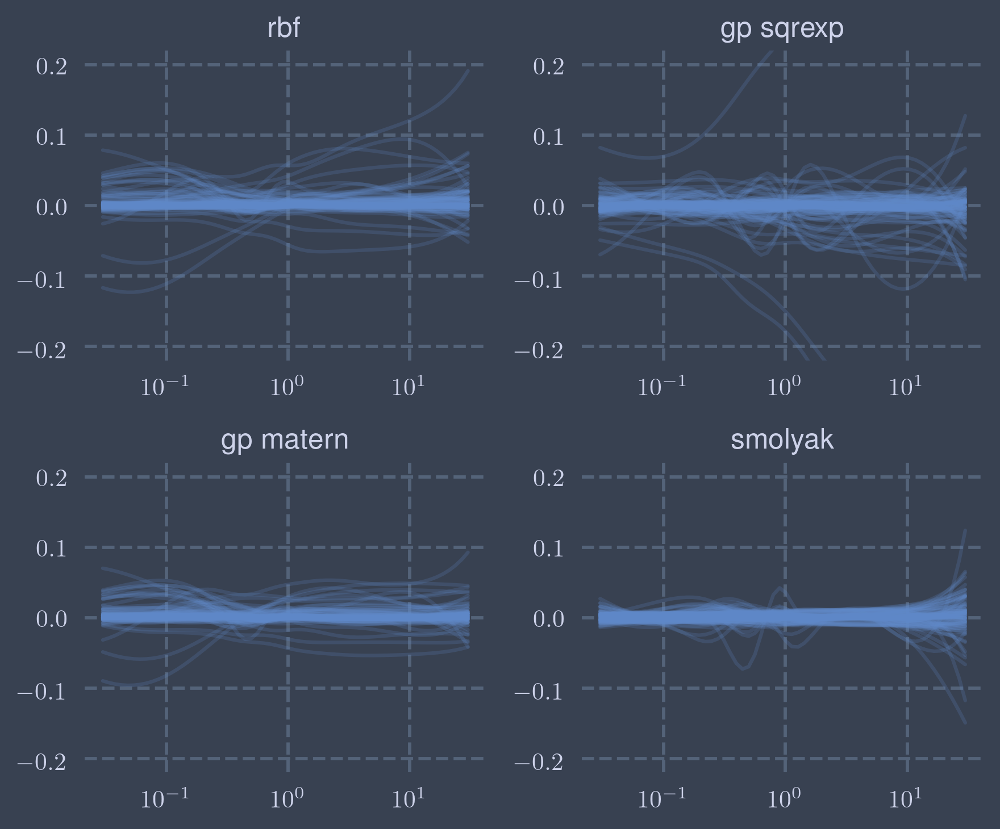

In [29]:
rbf_errs = (rbf_emulated - data_check)/data_check
gp_errs = (gp_emulated - data_check)/data_check
gp_errs_mat = (gp_emulated_mat - data_check)/data_check
smolyak_errs = (smolyak_emulated - data_check)/data_check

errs = [rbf_errs, gp_errs, gp_errs_mat, smolyak_errs]
labels = ['rbf', 'gp sqrexp', 'gp matern', 'smolyak']

fig = plt.figure(figsize=(6, 5))
for i in range(4):
    plotnum = 221 + i
    ax = fig.add_subplot(plotnum)
    ax.plot(rs, errs[i], color=colors[3], alpha=0.2)
    ax.set_xscale('log')
    ax.set_ylim((-0.22, 0.22))
    ax.set_title(labels[i])
    
plt.savefig('../figs/emulator/interp_errors_rand100.pdf')
pass

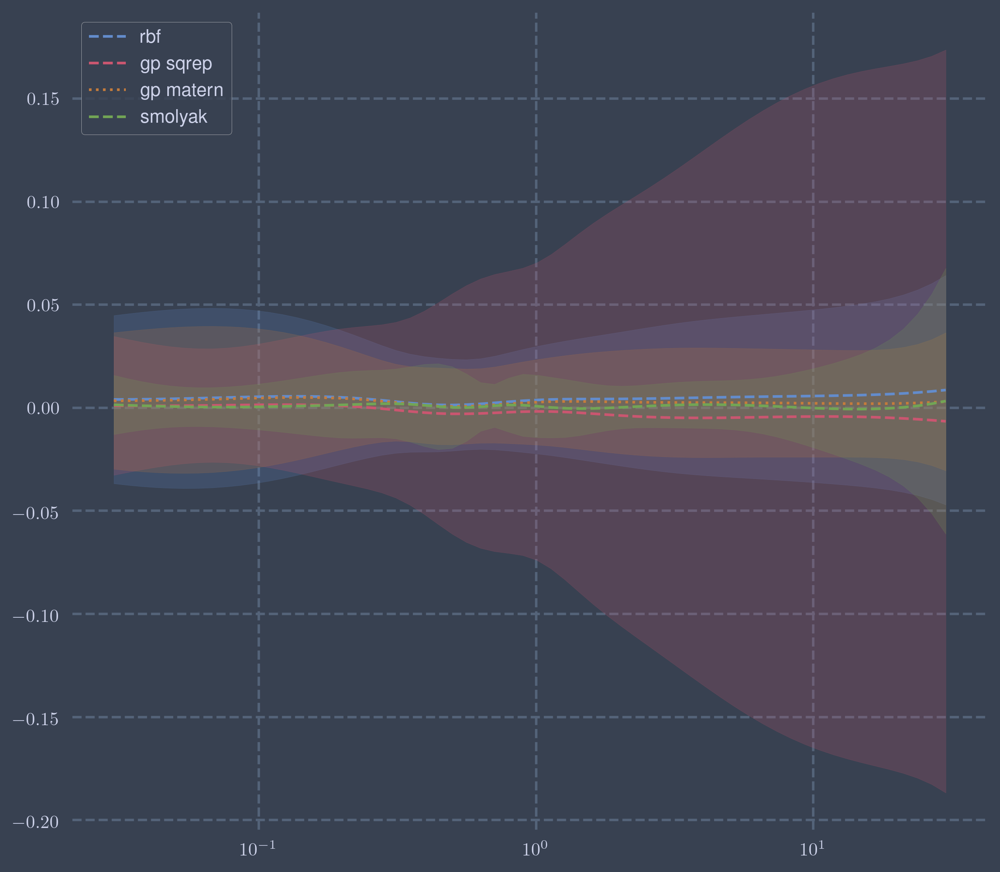

In [30]:
plt.plot(rs, rbf_errs.mean(axis=-1), color=colors[3], linestyle='--', label='rbf')
plt.fill_between(rs,
                 rbf_errs.mean(axis=-1) - 2*rbf_errs.std(axis=-1),
                 rbf_errs.mean(axis=-1) + 2*rbf_errs.std(axis=-1),
                 color=colors[3],
                 alpha=0.2)
plt.plot(rs, gp_errs.mean(axis=-1), color=colors[4], linestyle='--', label='gp sqrep')
plt.fill_between(rs,
                 gp_errs.mean(axis=-1) - 2*gp_errs.std(axis=-1),
                 gp_errs.mean(axis=-1) + 2*gp_errs.std(axis=-1),
                 color=colors[4],
                 alpha=0.2)
plt.plot(rs, gp_errs_mat.mean(axis=-1), color=colors[2], linestyle=':', label='gp matern')
plt.fill_between(rs,
                 gp_errs_mat.mean(axis=-1) - 2*gp_errs_mat.std(axis=-1),
                 gp_errs_mat.mean(axis=-1) + 2*gp_errs_mat.std(axis=-1),
                 color=colors[2],
                 alpha=0.2)
plt.plot(rs, smolyak_errs.mean(axis=-1), color=colors[0], linestyle='--', label='smolyak')
plt.fill_between(rs,
                 smolyak_errs.mean(axis=-1) - 2*smolyak_errs.std(axis=-1),
                 smolyak_errs.mean(axis=-1) + 2*smolyak_errs.std(axis=-1),
                 color=colors[0],
                 alpha=0.2)
plt.legend(loc='upper left')
plt.xscale('log')
plt.savefig('../figs/emulator/mean_errs_rand100.pdf')

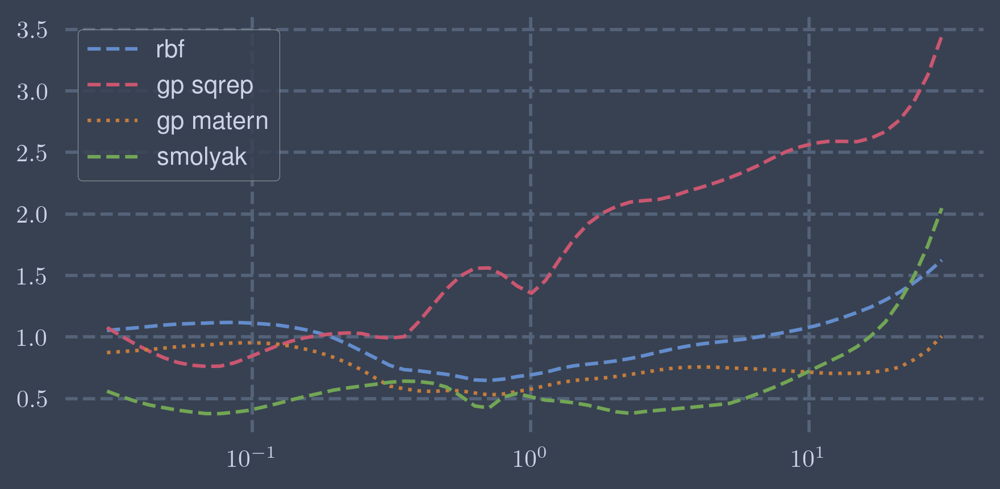

In [31]:
plt.plot(rs, 100*np.abs(rbf_errs).mean(axis=-1), color=colors[3], linestyle='--', label='rbf')
plt.plot(rs, 100*np.abs(gp_errs).mean(axis=-1), color=colors[4], linestyle='--', label='gp sqrep')
plt.plot(rs, 100*np.abs(gp_errs_mat).mean(axis=-1), color=colors[2], linestyle=':', label='gp matern')
plt.plot(rs, 100*np.abs(smolyak_errs).mean(axis=-1), color=colors[0], linestyle='--', label='smolyak')
plt.legend(loc='upper left')
plt.xscale('log')
plt.gcf().set_size_inches(6, 3)
pass